In [6]:
#Look for best parameters
import struct
import imghdr


#Function needed to obtain width and height of image
def get_image_size(fname):
    '''Determine the image type of fhandle and return its size.
    from draco'''
    with open(fname, 'rb') as fhandle:
        head = fhandle.read(24)
        if len(head) != 24:
            return
        if imghdr.what(fname) == 'png':
            check = struct.unpack('>i', head[4:8])[0]
            if check != 0x0d0a1a0a:
                return
            width, height = struct.unpack('>ii', head[16:24])
        elif imghdr.what(fname) == 'gif':
            width, height = struct.unpack('<HH', head[6:10])
        elif imghdr.what(fname) == 'jpeg':
            try:
                fhandle.seek(0) # Read 0xff next
                size = 2
                ftype = 0
                while not 0xc0 <= ftype <= 0xcf:
                    fhandle.seek(size, 1)
                    byte = fhandle.read(1)
                    while ord(byte) == 0xff:
                        byte = fhandle.read(1)
                    ftype = ord(byte)
                    size = struct.unpack('>H', fhandle.read(2))[0] - 2
                # We are at a SOFn block
                fhandle.seek(1, 1)  # Skip `precision' byte.
                height, width = struct.unpack('>HH', fhandle.read(4))
            except Exception: #IGNORE:W0703
                return
        else:
            return
        return width, height
    

In [7]:
# import the necessary packages
from collections import deque
from imutils.video import VideoStream
import numpy as np
import argparse
import cv2
import imutils
from skimage.morphology import erosion, dilation, opening, closing
import time
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb
from PIL import Image
from IPython.display import Image as IPImage, display



def compute_center(image_path, h_threshold, s_threshold, v_threshold, k_erode, k_dilate, iterat_erode, iterat_dilate, ratio_limit, white_threshold, white_pixel_ratio_threshold):
    frame = cv2.imread(image_path)
    frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)

    # Create masks for each channel
    h_mask = hsv[:, :, 0] < h_threshold
    s_mask = hsv[:, :, 1] < s_threshold
    v_mask = hsv[:, :, 2] < v_threshold

    combined_mask = v_mask & s_mask & h_mask

    mask_inv = np.ones_like(combined_mask, dtype=np.uint8) * 255
    mask_inv[combined_mask] = 0
    mask = cv2.bitwise_not(mask_inv)

    #Erosion and dilation
    kernel_erode = np.ones((k_erode, k_erode), np.uint8)
    kernel_dilate = np.ones((k_dilate, k_dilate), np.uint8)

    mask1 = cv2.erode(mask, kernel_erode, iterat_erode) 
    mask2 = cv2.dilate(mask1, kernel_dilate, iterat_dilate) 

    # Find contours
    contours, _ = cv2.findContours(mask2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    #Make groups
    distances = 999* np.ones((len(contours), len(contours)))

    if len(contours) == 0:
        return 999, 999, 999

    for i in range(len(contours)):
        for j in range(i + 1, len(contours)):
            # Find the centroid of each contour
            M1 = cv2.moments(contours[i])
            centroid1 = (int(M1['m10'] / M1['m00']), int(M1['m01'] / M1['m00']))

            M2 = cv2.moments(contours[j])
            centroid2 = (int(M2['m10'] / M2['m00']), int(M2['m01'] / M2['m00']))

            # Calculate Euclidean distance between centroids
            distance = np.sqrt((centroid1[0] - centroid2[0])**2 + (centroid1[1] - centroid2[1])**2)
            distances[i][j] = distance
            distances[j][i] = distance

    groups = []

    min_distances_indices = np.min(distances, axis=1)
    sourted_indices = np.argsort(min_distances_indices)


    for i in sourted_indices:
        if not (any(i in sublist for sublist in groups)): #checks if that contour hasn't appear yet and calculate its own group
            group = []
            sorted_indices = np.argsort(distances[i])

            max_distance = distances[i, sorted_indices[1]] #Used to compare. The biggest one of the two closest

            group.extend(sorted_indices[:2].tolist())

            for other_index in sorted_indices[2:]:
                for current_index in group:
                    if (distances[current_index, other_index] < ratio_limit * max_distance) and (other_index not in group):
                        group.append(other_index)
            
            groups.append(group)

    #Compute center
    old_best_ratio = 0

    for group in groups:
        group_contours = [contours[i] for i in group]
        group_contour = np.concatenate(group_contours)

        # Calculate minimum enclosing circle
        (x, y), radius = cv2.minEnclosingCircle(group_contour)
        center = (int(x), int(y))
        radius = int(radius)

        # Create a mask for whites inside the area encompassed by the circle
        mask_circle = np.zeros_like(frame, dtype=np.uint8)
        cv2.circle(mask_circle, center, radius, (255, 255, 255), thickness=-1)
        mask_binary = cv2.cvtColor(mask_circle, cv2.COLOR_BGR2GRAY)
        white_pixel_ratio = np.sum(frame[:, :, 2][mask_binary == 255] > white_threshold) / np.sum(mask_binary == 255)

        # Draw the circle only if the white pixel ratio is above the threshold
        if white_pixel_ratio > white_pixel_ratio_threshold and white_pixel_ratio > old_best_ratio:
            old_best_ratio = white_pixel_ratio
            best_radius = radius
            best_center = center
    
    if old_best_ratio == 0:
        return 999, 999, 999
    else:
        best_x, best_y = best_center

    return best_x, best_y, best_radius
                


In [8]:

#Function needed to obtain width and height of image
def get_image_size(fname):
    '''Determine the image type of fhandle and return its size.
    from draco'''
    with open(fname, 'rb') as fhandle:
        head = fhandle.read(24)
        if len(head) != 24:
            return
        if imghdr.what(fname) == 'png':
            check = struct.unpack('>i', head[4:8])[0]
            if check != 0x0d0a1a0a:
                return
            width, height = struct.unpack('>ii', head[16:24])
        elif imghdr.what(fname) == 'gif':
            width, height = struct.unpack('<HH', head[6:10])
        elif imghdr.what(fname) == 'jpeg':
            try:
                fhandle.seek(0) # Read 0xff next
                size = 2
                ftype = 0
                while not 0xc0 <= ftype <= 0xcf:
                    fhandle.seek(size, 1)
                    byte = fhandle.read(1)
                    while ord(byte) == 0xff:
                        byte = fhandle.read(1)
                    ftype = ord(byte)
                    size = struct.unpack('>H', fhandle.read(2))[0] - 2
                # We are at a SOFn block
                fhandle.seek(1, 1)  # Skip `precision' byte.
                height, width = struct.unpack('>HH', fhandle.read(4))
            except Exception: #IGNORE:W0703
                return
        else:
            return
        return width, height

In [9]:
#LOAD TEXT FILES
import os

with open('4class_trainval.txt', 'r') as file_imgnames:
    dataset = [line.strip() for line in file_imgnames]


images_info_dict = {}

lenn = len(dataset)
i=0
for image in dataset: 
    i+=1
    print(str(i)+'/'+str(lenn))
    image_n = image.split('/')
    image_png = image_n[2]
    
    image_nam = image_png.split('.')
    image_name = image_nam[0]

    label_file_path = 'labels/' + str(image_name) + '.txt'
    if os.path.exists(label_file_path) and os.path.exists('images/' + str(image_png)):
        with open(label_file_path, 'r') as file2:
            for line in file2:
                parts = line.strip().split()
                if parts[0] == '0': #means that is of class ball 0 0.4921875 0.264583333333 0.1875 0.25 [x_real, y_real, w_box, h_box]
                    width, height = get_image_size('images/' + str(image_png))
                    images_info_dict[image_png] = {'x_real': int(float(parts[1]))*width, 'y_real' :  int(float(parts[2]))*height, 'w_box' :  int(float(parts[3]))*width, 'h_box' :  int(float(parts[4]))*height}
    
print(images_info_dict)

1/4415
2/4415
3/4415
4/4415
5/4415
6/4415
7/4415
8/4415
9/4415
10/4415
11/4415
12/4415
13/4415
14/4415
15/4415
16/4415
17/4415
18/4415
19/4415
20/4415
21/4415
22/4415
23/4415
24/4415
25/4415
26/4415
27/4415
28/4415
29/4415
30/4415
31/4415
32/4415
33/4415
34/4415
35/4415
36/4415
37/4415
38/4415
39/4415
40/4415
41/4415
42/4415
43/4415
44/4415
45/4415
46/4415
47/4415
48/4415
49/4415
50/4415
51/4415
52/4415
53/4415
54/4415
55/4415
56/4415
57/4415
58/4415
59/4415
60/4415
61/4415
62/4415
63/4415
64/4415
65/4415
66/4415
67/4415
68/4415
69/4415
70/4415
71/4415
72/4415
73/4415
74/4415
75/4415
76/4415
77/4415
78/4415
79/4415
80/4415
81/4415
82/4415
83/4415
84/4415
85/4415
86/4415
87/4415
88/4415
89/4415
90/4415
91/4415
92/4415
93/4415
94/4415
95/4415
96/4415
97/4415
98/4415
99/4415
100/4415
101/4415
102/4415
103/4415
104/4415
105/4415
106/4415
107/4415
108/4415
109/4415
110/4415
111/4415
112/4415
113/4415
114/4415
115/4415
116/4415
117/4415
118/4415
119/4415
120/4415
121/4415
122/4415
123/4415
1

KeyboardInterrupt: 

In [ ]:
print(len(images_info_dict))
first_key, first_value = next(iter(images_info_dict.items()))
print(first_value)
print(first_value['x_real'])

3606
{'x_real': 0, 'y_real': 0, 'w_box': 0, 'h_box': 0}
0


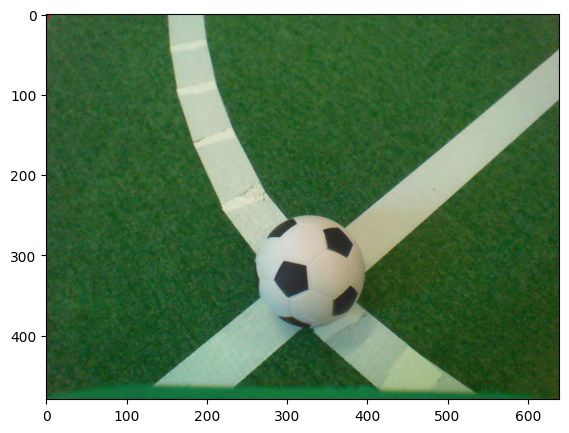

In [ ]:
image_path = 'images/' + str(first_key) 
frame = cv2.imread(image_path)


#Visualize function
def visualize(image, gray = False, hsv_rep = False):
    plt.figure(figsize=(10, 5))

    if hsv_rep and not gray:
        img = cv2.cvtColor(image, cv2.COLOR_HSV2BGR)
        plt.imshow(img) 

    elif not hsv_rep and gray:
        plt.imshow(image, cmap='gray')

    else:
        plt.imshow(image) 

    plt.show()

frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
best_center = (int(first_value['x_real']), int(first_value['y_real']))
best_radius = int(first_value['w_box']/2)
cv2.circle(frame, best_center, best_radius, (0, 255, 255), 2)
cv2.circle(frame, best_center, 5, (255, 0, 0), -1)

visualize(frame)

In [ ]:
num_combinations = (
    len(range(lim_h_threshold[0], lim_h_threshold[1], lim_h_threshold[2])) *
    len(range(lim_s_threshold[0], lim_s_threshold[1], lim_s_threshold[2])) *
    len(range(lim_v_threshold[0], lim_v_threshold[1], lim_v_threshold[2])) *
    len(range(lim_k_erode[0], lim_k_erode[1], lim_k_erode[2])) *
    len(range(lim_k_dilate[0], lim_k_dilate[1], lim_k_dilate[2])) *
    len(range(lim_iterat_erode[0], lim_iterat_erode[1], lim_iterat_erode[2])) *
    len(range(lim_iterat_dilate[0], lim_iterat_dilate[1], lim_iterat_dilate[2])) *
    len(np.arange(lim_ratio_limit[0], lim_ratio_limit[1], lim_ratio_limit[2])) *
    len(range(lim_white_threshold[0], lim_white_threshold[1], lim_white_threshold[2])) *
    len(np.arange(lim_white_pixel_ratio_threshold[0], lim_white_pixel_ratio_threshold[1], lim_white_pixel_ratio_threshold[2]))
)

print("Number of combinations:", num_combinations)


Number of combinations: 109863281250000


In [ ]:

#SET RANGE OF PARAMETERS WITH WHICH WE WILL PLAY
#lims [min, max, steps]

lim_h_threshold = [0, 250, 2] 
lim_s_threshold = [0, 250, 2]
lim_v_threshold = [0, 250, 2]

lim_k_erode = [0, 10, 1] 
lim_k_dilate = [0, 25, 1] 

lim_iterat_erode = [0, 5, 1] 
lim_iterat_dilate = [0, 5, 1] 

lim_ratio_limit = [1.2, 3, 0.1] 

lim_white_threshold = [150, 250, 2] 
lim_white_pixel_ratio_threshold = [0, 1, 0.1]


combinations = [] #each element will be a list with the parameters of the combination #index of the element. total length = number of combinations
puntuations = [] #each element will be a list of length the number of images in the datalist with 1 when correct and 0 when incorrect. total length = number of combinations x number of images

i = 0
#Accuracy calculation
for h_threshold in range(lim_h_threshold[0], lim_h_threshold[1], lim_h_threshold[2]):
    for s_threshold in range(lim_s_threshold[0], lim_s_threshold[1], lim_s_threshold[2]):
        for v_threshold in range(lim_v_threshold[0], lim_v_threshold[1], lim_v_threshold[2]):
            for k_erode in range(lim_k_erode[0], lim_k_erode[1], lim_k_erode[2]):
                for k_dilate in range(lim_k_dilate[0], lim_k_dilate[1], lim_k_dilate[2]):
                    for iterat_erode in range(lim_iterat_erode[0], lim_iterat_erode[1], lim_iterat_erode[2]):
                        for iterat_dilate in range(lim_iterat_dilate[0], lim_iterat_dilate[1], lim_iterat_dilate[2]):
                            for ratio_limit in np.arange(lim_ratio_limit[0], lim_ratio_limit[1], lim_ratio_limit[2]):
                                for white_threshold in range(lim_white_threshold[0], lim_white_threshold[1], lim_white_threshold[2]):
                                    for white_pixel_ratio_threshold in np.arange(lim_white_pixel_ratio_threshold[0], lim_white_pixel_ratio_threshold[1], lim_white_pixel_ratio_threshold[2]):
                                        i += 1
                                        print(i/(109863281250000))
                                        combinations.append([h_threshold, s_threshold, v_threshold, k_erode, k_dilate, iterat_erode, iterat_dilate, ratio_limit, white_threshold, white_pixel_ratio_threshold])
                                        puntuation_of_comb = []

                                        #for image, dict_of_img in images_info_dict.items():
                                        image, dict_of_img = next(iter(images_info_dict.items()))
                                        image_path = 'images/' + str(image)

                                        x_real = dict_of_img['x_real']
                                        y_real = dict_of_img['y_real']
                                        w_box = dict_of_img['w_box']
                                        h_box = dict_of_img['h_box']


                                        x_calc, y_calc, r_calc = compute_center(image_path, h_threshold, s_threshold, v_threshold, k_erode, k_dilate, iterat_erode, iterat_dilate, ratio_limit, white_threshold, white_pixel_ratio_threshold)

                                        correct_x = x_calc < x_real + w_box/2 and x_calc > x_real - w_box/2
                                        correct_y = y_calc < y_real + h_box/2 and y_calc > y_real - h_box/2

                                        if correct_x and correct_y:
                                            puntuation_of_comb.append(1)
                                        else:
                                            puntuation_of_comb.append(0)
                                        
                                        puntuations.append(puntuation_of_comb)

9.102222222222222e-15
1.8204444444444444e-14
2.7306666666666667e-14
3.640888888888889e-14
4.551111111111111e-14
5.461333333333333e-14
6.371555555555556e-14
7.281777777777778e-14
8.192e-14
9.102222222222222e-14
1.0012444444444445e-13
1.0922666666666667e-13
1.1832888888888888e-13
1.2743111111111112e-13
1.3653333333333334e-13
1.4563555555555555e-13
1.5473777777777777e-13
1.6384e-13
1.7294222222222223e-13
1.8204444444444444e-13
1.9114666666666666e-13
2.002488888888889e-13
2.0935111111111112e-13
2.1845333333333333e-13
2.2755555555555557e-13
2.3665777777777776e-13
2.4576e-13
2.5486222222222225e-13
2.6396444444444444e-13
2.730666666666667e-13
2.8216888888888887e-13
2.912711111111111e-13
3.0037333333333335e-13
3.0947555555555554e-13
3.185777777777778e-13
3.2768e-13
3.367822222222222e-13
3.4588444444444446e-13
3.5498666666666665e-13
3.640888888888889e-13
3.7319111111111113e-13
3.822933333333333e-13
3.9139555555555556e-13
4.004977777777778e-13
4.096e-13
4.1870222222222223e-13
4.278044444444444e-